In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

In [7]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [9]:
#from keras.callbacks import EarlyS
from keras.callbacks import EarlyStopping

In [11]:
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools
import cv2

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [22]:
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical

# Define paths
au_path = "/kaggle/input/casia-dataset/CASIA2/Au"  # Authentic images
tp_path = "/kaggle/input/casia-dataset/CASIA2/Tp"  # Tampered images

# Initialize lists
X = []  # Images
Y = []  # Labels (0=Tampered, 1=Authentic)

def convert_to_ela_image(path, quality=90):
    temp_filename = 'temp.jpg'
    ela_filename = 'temp_ela.png'
    
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality=quality)
    temp_image = Image.open(temp_filename)
    
    ela_image = ImageChops.difference(image, temp_image)
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image

def prepare_image_ela(image_path, target_size=(128, 128)):
    return np.array(convert_to_ela_image(image_path).resize(target_size)) / 255.0

# Load Authentic (Au) images
for img_name in os.listdir(au_path):
    img_path = os.path.join(au_path, img_name)
    if img_path.endswith(('.jpg', '.png', '.tif')):
        X.append(prepare_image_ela(img_path))  # Change to prepare_image_noise() or prepare_image_edges() for other methods
        Y.append(1)  # Label 1 = Authentic

# Load Tampered (Tp) images
for img_name in os.listdir(tp_path):
    img_path = os.path.join(tp_path, img_name)
    if img_path.endswith(('.jpg', '.png', '.tif')):
        X.append(prepare_image_ela(img_path))  # Change function as needed
        Y.append(0)  # Label 0 = Tampered

# Convert to numpy arrays
X = np.array(X)
Y = to_categorical(Y, 2)  # One-hot encoding

# Split into Train, Validation, Test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=42)
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.2, random_state=42)

print("Train:", X_train.shape, Y_train.shape)
print("Val:", X_val.shape, Y_val.shape)
print("Test:", X_test.shape, Y_test.shape)

Train: (8983, 128, 128, 3) (8983, 2)
Val: (2246, 128, 128, 3) (2246, 2)
Test: (1248, 128, 128, 3) (1248, 2)


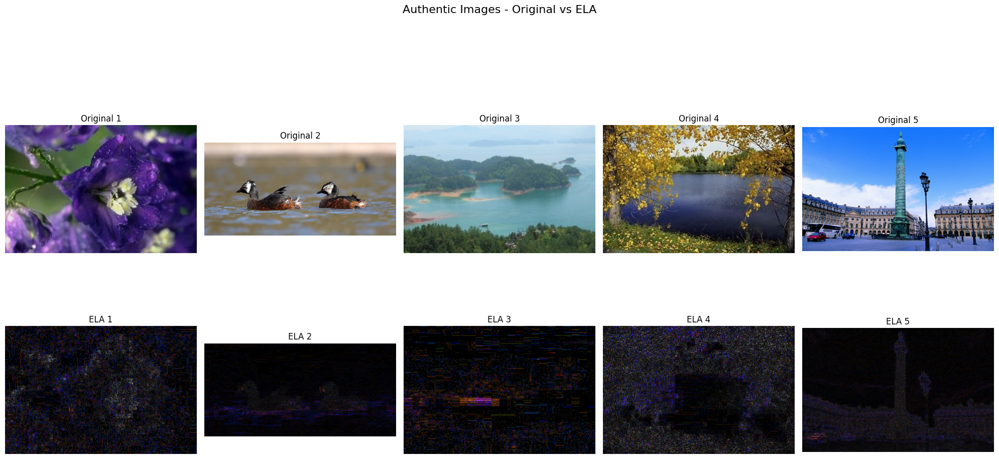

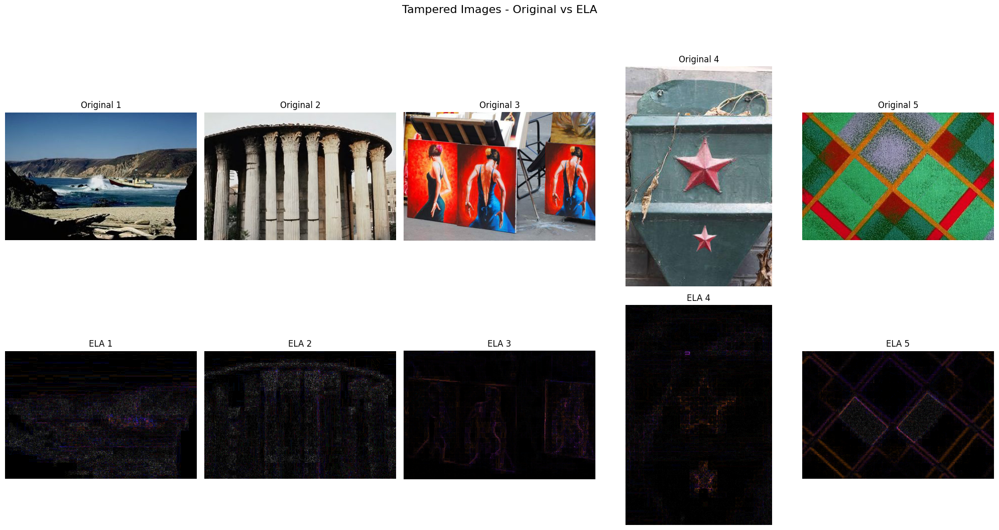

In [23]:
def display_ela_with_original(image_paths, title):
    plt.figure(figsize=(20, 10))
    plt.suptitle(title, fontsize=16, y=1.05)
    
    for i, img_path in enumerate(image_paths[:5]):
        # Original Image
        plt.subplot(2, 5, i+1)
        orig_img = Image.open(img_path)
        plt.imshow(orig_img)
        plt.title(f"Original {i+1}")
        plt.axis('off')
        
        # ELA Processed Image
        plt.subplot(2, 5, i+6)
        ela_img = convert_to_ela_image(img_path)
        plt.imshow(ela_img)
        plt.title(f"ELA {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Authentic images
au_images = [os.path.join(au_path, f) for f in os.listdir(au_path) if f.endswith(('.jpg', '.png', '.tif'))]
display_ela_with_original(au_images, "Authentic Images - Original vs ELA")

# Tampered images
tp_images = [os.path.join(tp_path, f) for f in os.listdir(tp_path) if f.endswith(('.jpg', '.png', '.tif'))]
display_ela_with_original(tp_images, "Tampered Images - Original vs ELA")

In [24]:
def build_ela_model(input_shape=(128, 128, 3)):
    model = Sequential([
        Conv2D(32, (5, 5), activation='relu', input_shape=input_shape),
        Conv2D(32, (5, 5), activation='relu'),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Conv2D(64, (3, 3), activation='relu'),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])
    return model

# Compile & Train
model_ela = build_ela_model()
model_ela.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

history_ela = model_ela.fit(
    X_train, Y_train,
    batch_size=32,
    epochs=10,
    validation_data=(X_val, Y_val)
)

model_ela.save('ela_model.h5')

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1747930431.056139      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1747930431.056722      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Epoch 1/10


I0000 00:00:1747930440.199915     135 service.cc:148] XLA service 0x7afc48011370 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747930440.200618     135 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1747930440.200646     135 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1747930440.563692     135 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/281 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - accuracy: 0.5938 - loss: 0.6761 

I0000 00:00:1747930447.166551     135 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


281/281 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.7271 - loss: 0.4816 - val_accuracy: 0.8673 - val_loss: 0.3419
Epoch 2/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - accuracy: 0.8776 - loss: 0.3235 - val_accuracy: 0.8415 - val_loss: 0.3789
Epoch 3/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - accuracy: 0.8760 - loss: 0.3193 - val_accuracy: 0.8722 - val_loss: 0.3353
Epoch 4/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - accuracy: 0.8815 - loss: 0.3019 - val_accuracy: 0.8785 - val_loss: 0.3221
Epoch 5/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - accuracy: 0.8750 - loss: 0.3158 - val_accuracy: 0.8669 - val_loss: 0.3361
Epoch 6/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - accuracy: 0.8736 - loss: 0.2998 - val_accuracy: 0.8776 - val_loss: 0.3153
Epoch 7/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - accuracy: 0.8928 - loss: 0.2777 - val_accuracy: 0.8811 - val_loss: 0.3011
Epoch 8/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - accuracy: 0.8945 - loss: 0.2732 - val_accurac

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
Classification Report:
              precision    recall  f1-score   support

    Tampered       0.83      0.92      0.87       477
        Real       0.94      0.88      0.91       771

    accuracy                           0.90      1248
   macro avg       0.89      0.90      0.89      1248
weighted avg       0.90      0.90      0.90      1248



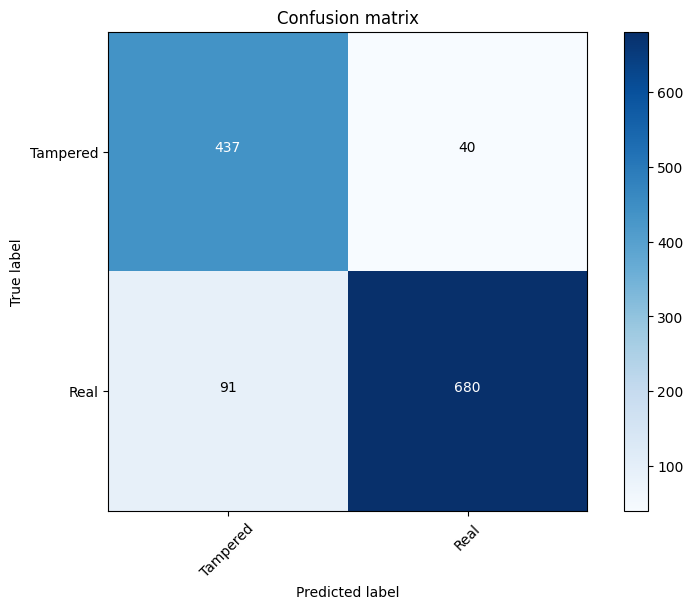

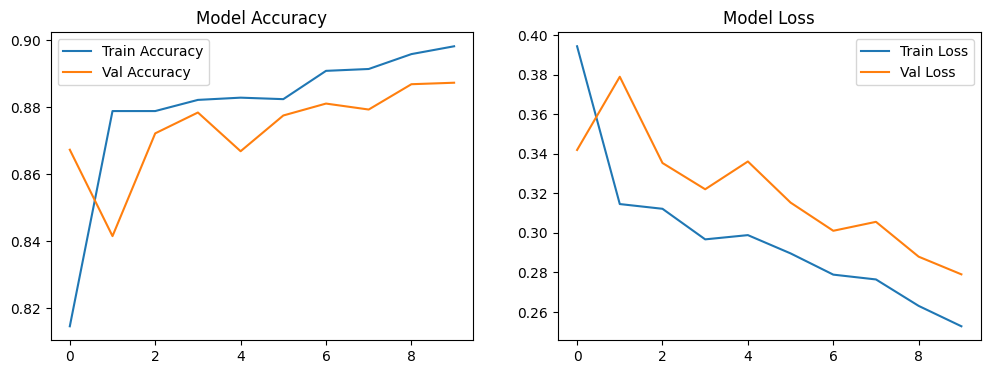

In [25]:
from sklearn.metrics import classification_report, confusion_matrix

# Predictions
Y_pred = model_ela.predict(X_test)
Y_pred_classes = np.argmax(Y_pred, axis=1)
Y_true = np.argmax(Y_test, axis=1)

# Classification Report
print("Classification Report:")
print(classification_report(Y_true, Y_pred_classes, target_names=['Tampered', 'Real']))

# Confusion Matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
plt.figure(figsize=(8, 6))
plot_confusion_matrix(confusion_mtx, classes=['Tampered', 'Real'])
plt.show()

# Accuracy/Loss Plots
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_ela.history['accuracy'], label='Train Accuracy')
plt.plot(history_ela.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_ela.history['loss'], label='Train Loss')
plt.plot(history_ela.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.legend()
plt.show()

In [ ]:
CNN Model for Noise Analysis

In [27]:
def extract_noise(image_path, target_size=(128, 128)):
    image = cv2.imread(image_path)
    if image is None:
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    
    # Apply a denoising filter and subtract to get noise
    denoised = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
    noise = cv2.absdiff(image, denoised)
    noise = noise.astype(np.float32) / 255.0
    
    return noise

def prepare_image_noise(image_path):
    noise = extract_noise(image_path)
    if noise is None:
        return np.zeros((128, 128, 3))  # Fallback if image fails to load
    return noise

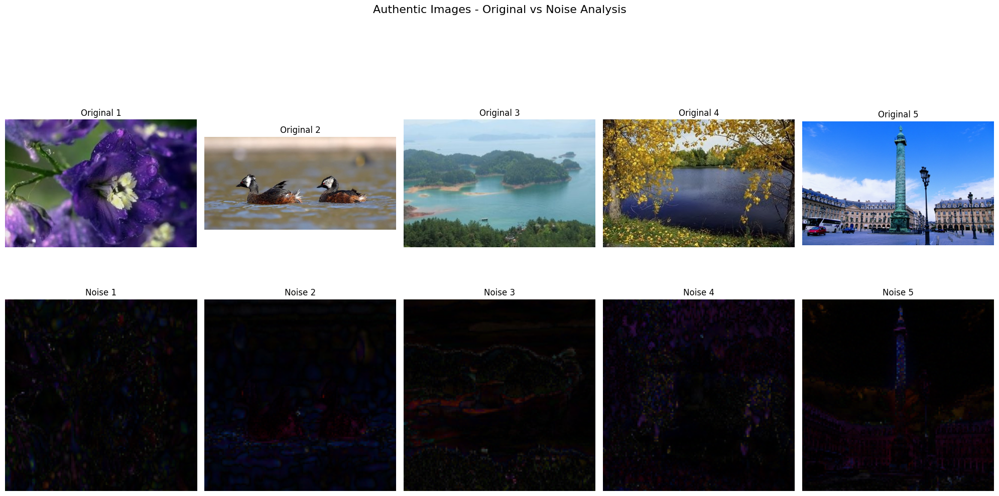

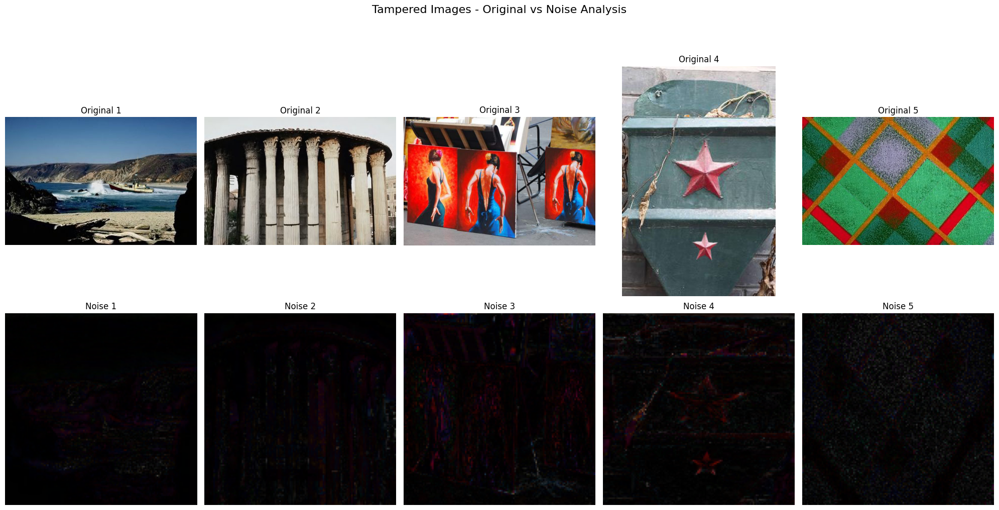

In [28]:
def display_noise_with_original(image_paths, title):
    plt.figure(figsize=(20, 10))
    plt.suptitle(title, fontsize=16, y=1.05)
    
    for i, img_path in enumerate(image_paths[:5]):
        # Original Image
        plt.subplot(2, 5, i+1)
        orig_img = Image.open(img_path)
        plt.imshow(orig_img)
        plt.title(f"Original {i+1}")
        plt.axis('off')
        
        # Noise Processed Image
        plt.subplot(2, 5, i+6)
        noise_img = extract_noise(img_path)
        plt.imshow(noise_img)
        plt.title(f"Noise {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

display_noise_with_original(au_images, "Authentic Images - Original vs Noise Analysis")
display_noise_with_original(tp_images, "Tampered Images - Original vs Noise Analysis")

In [29]:
def build_noise_model(input_shape=(128, 128, 3)):
    model = Sequential([
        Conv2D(32, (5, 5), activation='relu', input_shape=input_shape),
        Conv2D(32, (5, 5), activation='relu'),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Conv2D(64, (3, 3), activation='relu'),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])
    return model

# Compile & Train
model_noise = build_noise_model()
model_noise.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

history_noise = model_noise.fit(
    X_train, Y_train,
    batch_size=32,
    epochs=10,
    validation_data=(X_val, Y_val)
)

model_noise.save('noise_model.h5')

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step - accuracy: 0.7082 - loss: 0.4991 - val_accuracy: 0.8624 - val_loss: 0.3516
Epoch 2/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8773 - loss: 0.3272 - val_accuracy: 0.8633 - val_loss: 0.3578
Epoch 3/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8805 - loss: 0.3144 - val_accuracy: 0.8687 - val_loss: 0.3373
Epoch 4/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8778 - loss: 0.3054 - val_accuracy: 0.8713 - val_loss: 0.3294
Epoch 5/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8818 - loss: 0.3032 - val_accuracy: 0.8727 - val_loss: 0.3300
Epoch 6/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8863 - loss: 0.2906 - val_accuracy: 0.8758 - val_loss: 0.3096
Epoch 7/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8874 - loss: 0.2897 - val_accuracy: 0.8740 - val_loss: 0.3127
Epoch 8/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8807 - loss: 0.3038 - 

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Classification Report:
              precision    recall  f1-score   support

    Tampered       0.83      0.91      0.87       477
        Real       0.94      0.88      0.91       771

    accuracy                           0.89      1248
   macro avg       0.88      0.90      0.89      1248
weighted avg       0.90      0.89      0.89      1248



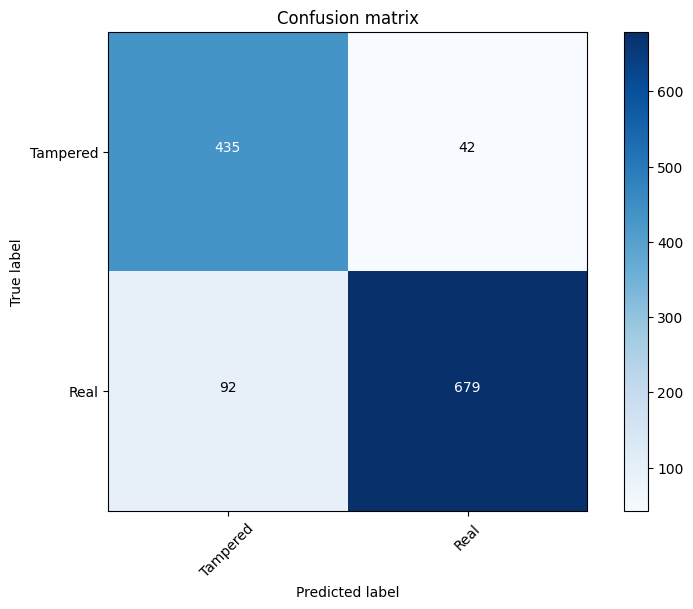

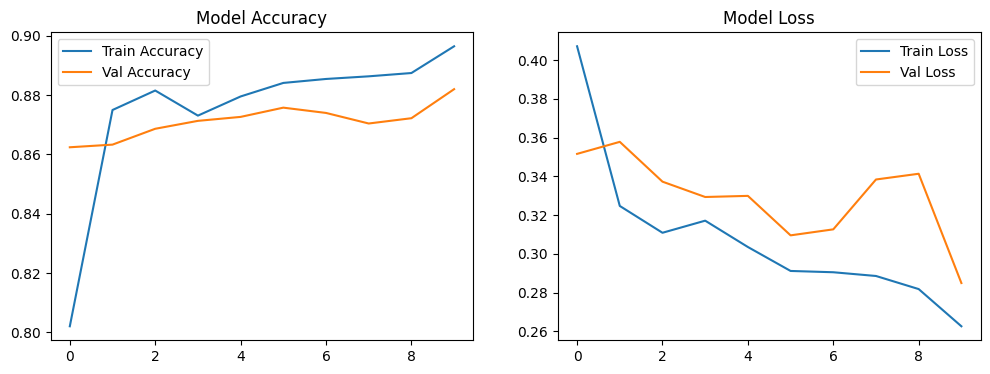

In [30]:
from sklearn.metrics import classification_report, confusion_matrix

# Predictions
Y_pred = model_noise.predict(X_test)
Y_pred_classes = np.argmax(Y_pred, axis=1)
Y_true = np.argmax(Y_test, axis=1)

# Classification Report
print("Classification Report:")
print(classification_report(Y_true, Y_pred_classes, target_names=['Tampered', 'Real']))

# Confusion Matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
plt.figure(figsize=(8, 6))
plot_confusion_matrix(confusion_mtx, classes=['Tampered', 'Real'])
plt.show()

# Accuracy/Loss Plots
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_noise.history['accuracy'], label='Train Accuracy')
plt.plot(history_noise.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_noise.history['loss'], label='Train Loss')
plt.plot(history_noise.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.legend()
plt.show()

CNN Model for Edge Detection

In [32]:
def extract_edges(image_path, target_size=(128, 128)):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        return None
    image = cv2.resize(image, target_size)
    
    # Apply Gaussian blur & Canny edge detection
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)  # Convert to 3-channel for CNN
    edges = edges.astype(np.float32) / 255.0
    
    return edges

def prepare_image_edges(image_path):
    edges = extract_edges(image_path)
    if edges is None:
        return np.zeros((128, 128, 3))  # Fallback if image fails to load
    return edges

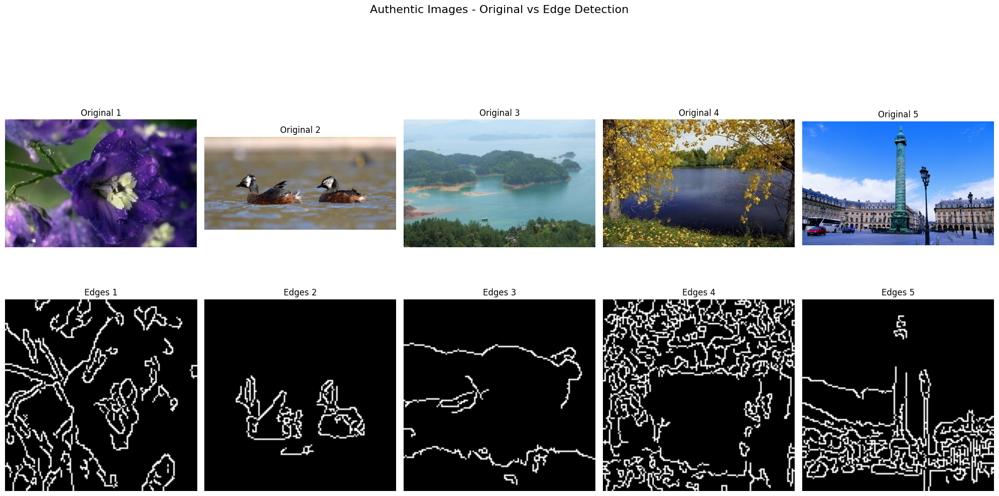

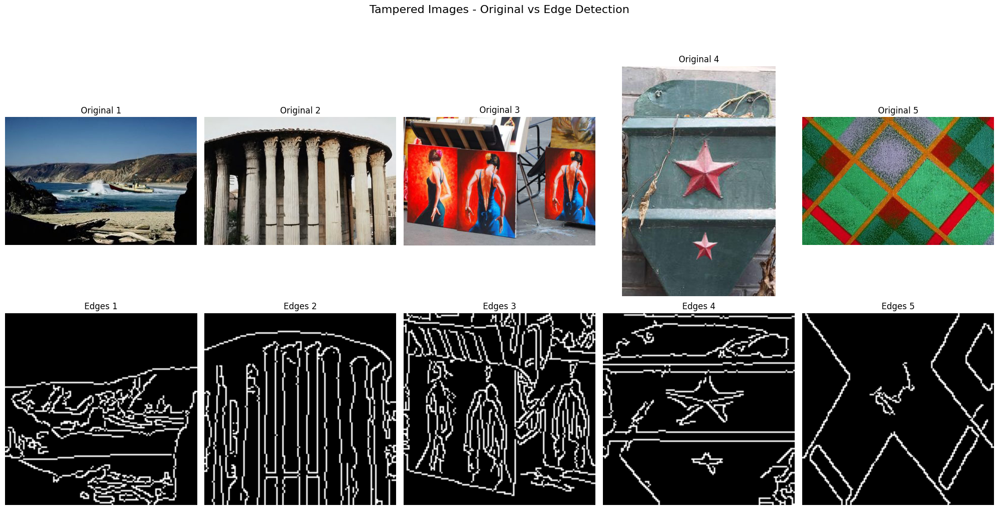

In [33]:
def display_edges_with_original(image_paths, title):
    plt.figure(figsize=(20, 10))
    plt.suptitle(title, fontsize=16, y=1.05)
    
    for i, img_path in enumerate(image_paths[:5]):
        # Original Image
        plt.subplot(2, 5, i+1)
        orig_img = Image.open(img_path)
        plt.imshow(orig_img)
        plt.title(f"Original {i+1}")
        plt.axis('off')
        
        # Edge Detection Image
        plt.subplot(2, 5, i+6)
        edge_img = extract_edges(img_path)
        plt.imshow(edge_img, cmap='gray')
        plt.title(f"Edges {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

display_edges_with_original(au_images, "Authentic Images - Original vs Edge Detection")
display_edges_with_original(tp_images, "Tampered Images - Original vs Edge Detection")

In [ ]:
def build_edge_model(input_shape=(128, 128, 3)):
    model = Sequential([
        Conv2D(32, (5, 5), activation='relu', input_shape=input_shape),
        Conv2D(32, (5, 5), activation='relu'),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Conv2D(64, (3, 3), activation='relu'),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPool2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(2, activation='softmax')
    ])
    return model

# Compile & Train
model_edge = build_edge_model()
model_edge.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

history_edge = model_edge.fit(
    X_train, Y_train,
    batch_size=32,
    epochs=10,
    validation_data=(X_val, Y_val)
)

model_edge.save('edge_model.h5')

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step - accuracy: 0.6940 - loss: 0.5078 - val_accuracy: 0.8602 - val_loss: 0.3508
Epoch 2/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8803 - loss: 0.3100 - val_accuracy: 0.8508 - val_loss: 0.3723
Epoch 3/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8820 - loss: 0.3138 - val_accuracy: 0.8744 - val_loss: 0.3205
Epoch 4/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8879 - loss: 0.2954 - val_accuracy: 0.8691 - val_loss: 0.3197
Epoch 5/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.8803 - loss: 0.2979 - val_accuracy: 0.8722 - val_loss: 0.3281
Epoch 6/10
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.8880 - loss: 0.2758